Using tutorial:
    https://towardsdatascience.com/how-to-cluster-images-based-on-visual-similarity-cd6e7209fe34

In [95]:
from keras.preprocessing.image import load_img 
from keras.preprocessing.image import img_to_array 
from keras.applications.vgg16 import preprocess_input 

# models 
from keras.applications.vgg16 import VGG16 
from keras.models import Model

# clustering and dimension reduction
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

# for everything else
import os
import numpy as np
import matplotlib.pyplot as plt
from random import randint
import pandas as pd
import pickle

#Visualizing pictures
from skimage import io
from skimage import exposure
import skimage.color as color
import math

In [6]:
path = '/Users/dianaaguilar/Documents/GitHub/frogFun/sampleImages/AllProcessed/'
# change the working directory to the path where the images are located
os.chdir(path)


In [7]:
# this list holds all the image filename
frogs = []

# creates a ScandirIterator aliased as files
with os.scandir(path) as files:
  # loops through each file in the directory
    for file in files:
        if file.name.endswith('.png'):
          # adds only the image files to the flowers list
            frogs.append(file.name)

In [194]:
# load the model first and pass as an argument
model = VGG16()
model = Model(inputs = model.inputs, outputs = model.layers[-2].output)

def extract_features(file, model):
    # load the image as a 224x224 array
    img = load_img(file, target_size=(224,224))
    # convert from 'PIL.Image.Image' to numpy array
    img = np.array(img) 
    
    # reshape the data for the model reshape(num_of_samples, dim 1, dim 2, channels)
    reshaped_img = img.reshape(1,224,224,3) 
    # prepare image for model
    imgx = preprocess_input(reshaped_img)
    # get the feature vector
    features = model.predict(imgx, use_multiprocessing=True)
    return features

In [195]:
data = {}
p = '/Users/dianaaguilar/Documents/GitHub/frogFun/outputFiles/frogs.pkl'

# lop through each image in the dataset
for frog in frogs:
    # try to extract the features and update the dictionary
    try:
        feat = extract_features(frog,model)
        data[frog] = feat
    # if something fails, save the extracted features as a pickle file (optional)
    except:
        with open(p,'wb') as file:
            pickle.dump(data,file)
          

In [196]:
# get a list of the filenames
filenames = np.array(list(data.keys()))

In [197]:
# get a list of just the features
feat = np.array(list(data.values()))
#Reshape
feat = feat.reshape(-1,4096)
#feat.shape

In [198]:
pca = PCA(n_components=100, random_state=22)
pca.fit(feat)
x = pca.transform(feat)

In [200]:
kmeans = KMeans(n_clusters=6, random_state=22)
kmeans.fit(x)

KMeans(n_clusters=6, random_state=22)

In [201]:
groups = {}
for file, cluster in zip(filenames,kmeans.labels_):
    if cluster not in groups.keys():
        groups[cluster] = []
        groups[cluster].append(file)
    else:
        groups[cluster].append(file)

In [202]:
group=groups[0]

n_frogs=len(group)
n_frogs

path+group[0]

'/Users/dianaaguilar/Documents/GitHub/frogFun/sampleImages/AllProcessed/CL15-PD.png'

In [203]:
def plotGroup(i,group=groups[i]):
    n_frogs=len(group)
    fig, axs = plt.subplots(math.ceil(n_frogs/3), 3)
    fig.set_size_inches(18.5, n_frogs)

    n=0
    y=0
    for frog in group:
        if y==3:
            y= 0
            n+=1 
        image = io.imread(path+frog, pilmode='RGBA')
        gamma2=exposure.adjust_log(image)
        gamma3=exposure.adjust_log(gamma2)
        ranita0 = color.rgba2rgb(gamma3) 
        ranita = color.rgb2gray(ranita0) 
    
        axs[n,y].imshow(image,aspect='auto')
        y+=1
    plt.savefig("../../outputFiles/group"+str(i)+".png")

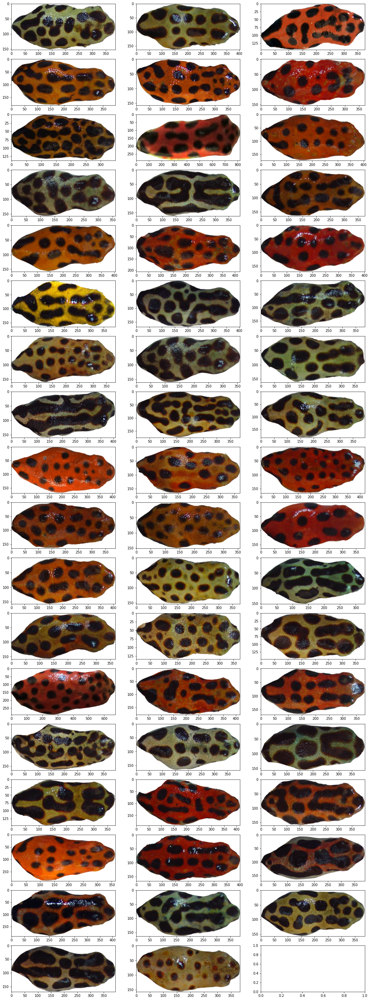

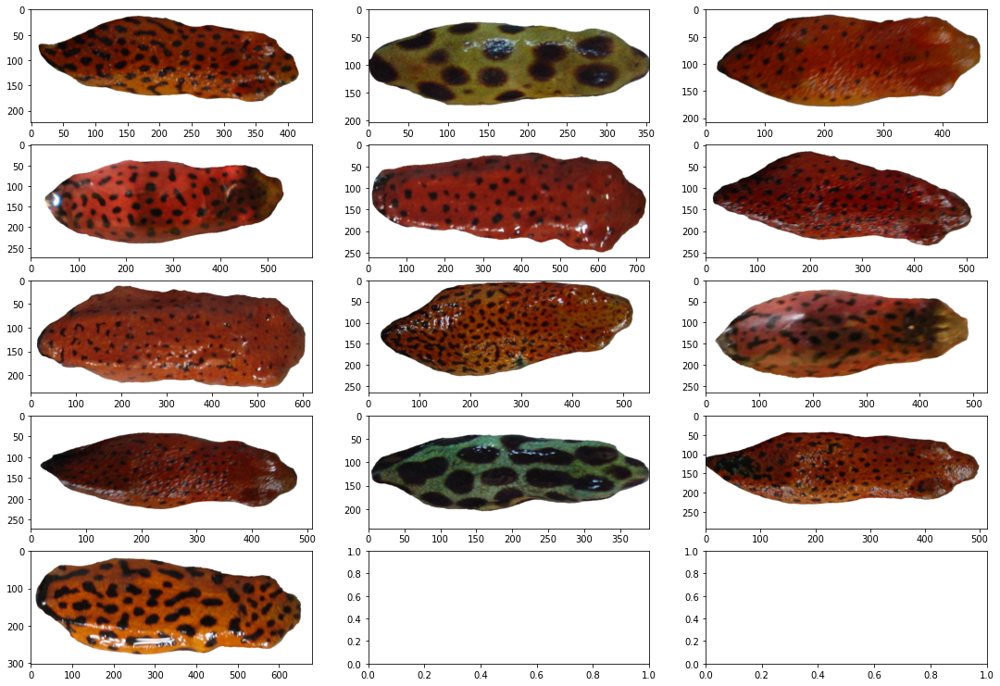

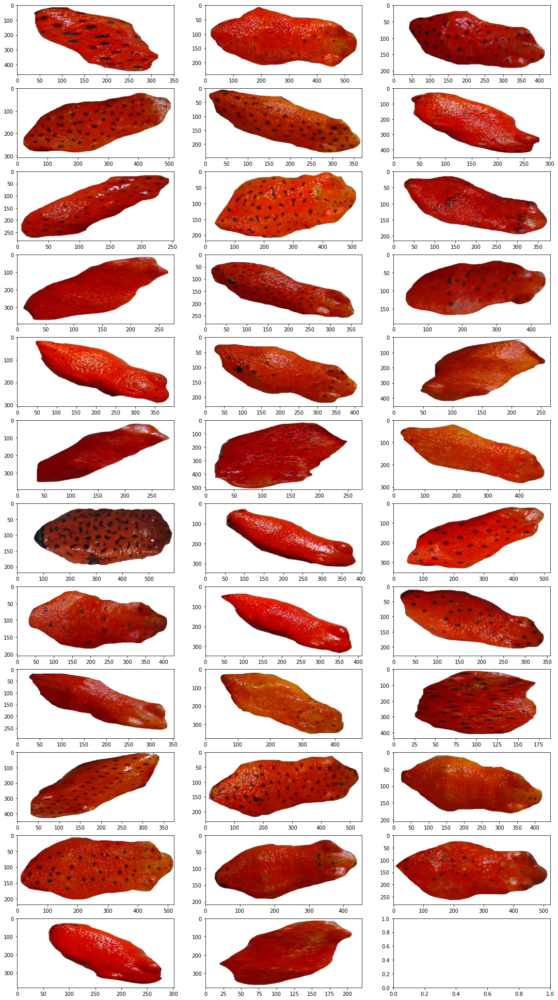

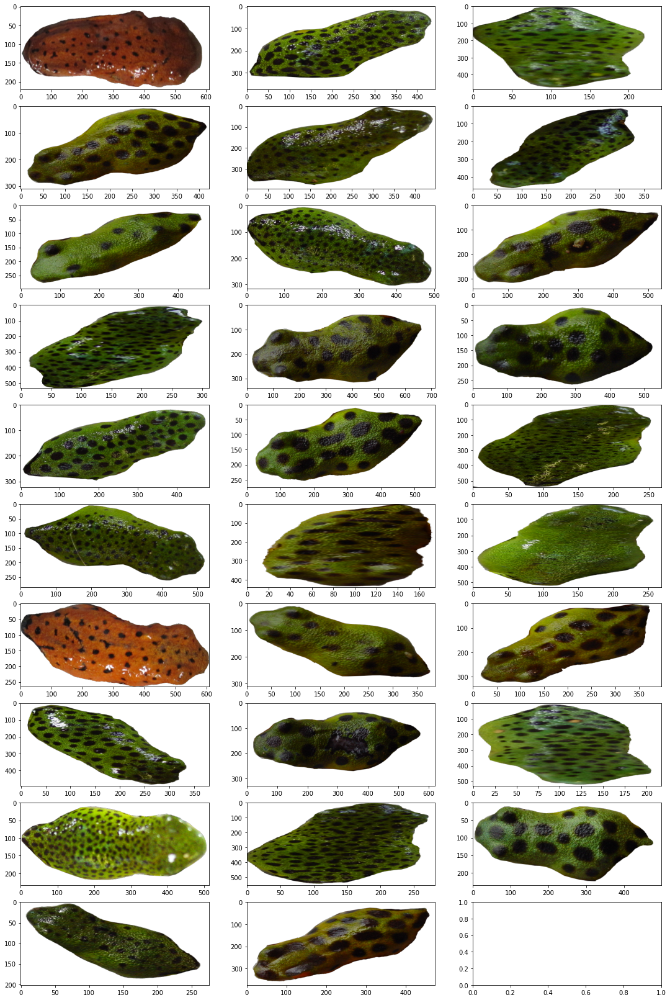

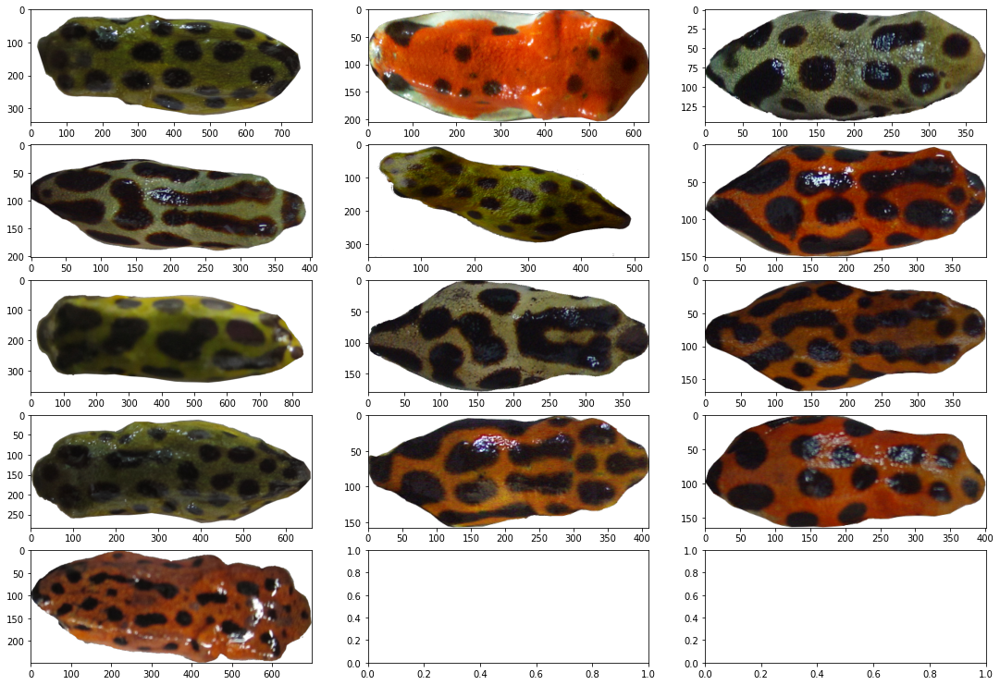

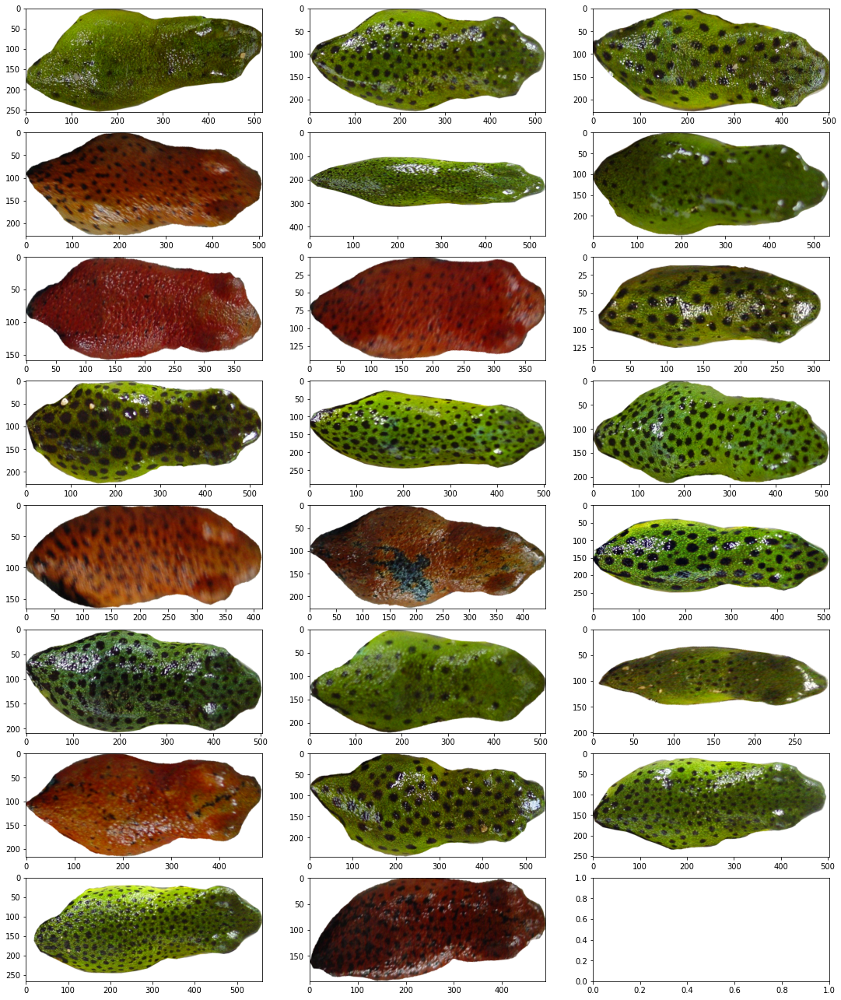

In [204]:

for i in groups:
    plotGroup(i,groups[i])